### 전국 노인 보호구역 현황 & 전국 노인 보행자 사고 현황

In [14]:
import pandas as pd
import pandas_gbq

In [2]:
#bigquery 연동하기 
from google.oauth2 import service_account
from google.cloud import bigquery

In [3]:
credentials = service_account.Credentials.from_service_account_file("./bigquery_key_json.json")

In [4]:
credentials

In [5]:
client = bigquery.Client(
    credentials=credentials,
    project=credentials.project_id
)

In [6]:
client

In [7]:
query = """
SELECT * FROM `moonlit-vine-428804-p9.semi_project.old_safety_zone_1`
"""

In [8]:
df = client.query(query).to_dataframe()

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/google/cloud/bigquery/table.py:1727: UserWarning: BigQuery Storage module not found, fetch data with the REST endpoint instead.
  warnings.warn(


In [9]:
preprocessed_df= df[['facility','province','district','district_code','new_adress','previous_adress','latitude','longitude','cctv','cctv_cnt',]]

In [15]:
pandas_gbq.to_gbq(preprocessed_df, 'semi_project.old_safety_zone_1', project_id='moonlit-vine-428804-p9', if_exists='replace')

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 4466.78it/s]


### 지도 시각화 _ 전국 노인보호구역 현황 

In [17]:
# 전국 노인보호구역 21~24년자료
import pandas as pd
import folium

query = """
SELECT 
    facility, 
    latitude, 
    longitude

FROM `moonlit-vine-428804-p9.semi_project.old_safety_zone_1`

"""

In [18]:
old_safety_zone_df = client.query(query).to_dataframe()

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/google/cloud/bigquery/table.py:1727: UserWarning: BigQuery Storage module not found, fetch data with the REST endpoint instead.
  warnings.warn(


In [19]:
# 지도 생성 (초기 중심 좌표를 첫 번째 데이터의 위치로 설정)
map_positron = folium.Map(location=[old_safety_zone_df['latitude'].iloc[0], old_safety_zone_df['longitude'].iloc[0]], zoom_start=12)

In [20]:
# 전국 노인 보호구역 21~24년 데이터 마커 추가
for idx, row in old_safety_zone_df.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        popup=row['facility'],
        radius=5,
        color='blue',
        fill=True,
        fill_color='blue'
    ).add_to(map_positron)

### 전국 노인 보행자 사고 중, 노인 보호구역 500m 외 사고 수 시각화

In [23]:
# 전체 노인 보행 사고 자료 2012~2022
sql = """
SELECT 

    spot_nm AS spot_nm,
    la_crd AS latitude,
    lo_crd AS longitude

FROM `moonlit-vine-428804-p9.semi_project.senior_accident_info`
"""

In [24]:
accidents_total_df = client.query(sql).to_dataframe()

In [25]:
# 노인 500m 외 사고
for idx, row in accidents_total_df.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        popup=row['spot_nm'],
        radius=5,
        color='purple',  # 첫 번째 테이블의 마커 색상 지정
        fill=True,
        fill_color= 'purple' # 두 번째 테이블의 마커 색상 지정
    
    ).add_to(map_positron)

In [27]:
# 전국 보호소 주변 500M 내 노인 보행 사고 자료 2012~2022
sql = """
SELECT 

    spot_nm AS spot_nm,
    la_crd AS latitude,
    lo_crd AS longitude

FROM `moonlit-vine-428804-p9.semi_project.accidents_within_500m_re`
"""

In [28]:
accidents_within_500m_df = client.query(sql).to_dataframe()

In [29]:
# 보호소 주변 500M 내 노인 보행 사고 자료 2012~22
for idx, row in accidents_within_500m_df.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        popup=row['spot_nm'],
        radius=5,
        color= 'red',
        fill=True,
        fill_color='red' # 두 번째 테이블의 마커 색상 지정
    
    ).add_to(map_positron)

In [30]:
map_positron

### 노인 보행자 사고 증가율

In [19]:
# 노인 보행자 사고 증가율
sql = """
SELECT 
  sum(occrrnc_cnt) as accidents,
  year
FROM `moonlit-vine-428804-p9.semi_project.senior_accident_info`

GROUP BY
  year

ORDER BY
  year
"""

In [20]:
accidents_df = client.query(sql).to_dataframe()

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/google/cloud/bigquery/table.py:1727: UserWarning: BigQuery Storage module not found, fetch data with the REST endpoint instead.
  warnings.warn(


In [21]:
accidents_df.set_index("year")

,accidents
year,
2012,2049
2013,2220
2014,2549
2015,2582
2016,2393
2017,2252
2018,2156
2019,2362
2020,1916


### 노인보호구역 500m 내 보행자 사고 증가율

In [16]:
# 노인보호구역 500m 내 보행자 사고 증가율
sql = """
SELECT 
    sum(occrrnc_cnt) as accidents,
    year
FROM 
    `moonlit-vine-428804-p9.semi_project.accidents_within_500m_re`

GROUP BY
    year

ORDER BY
    year
"""

In [17]:
accidents_within_500_df = client.query(sql).to_dataframe()

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/google/cloud/bigquery/table.py:1727: UserWarning: BigQuery Storage module not found, fetch data with the REST endpoint instead.
  warnings.warn(


In [18]:
accidents_within_500_df.set_index("year")

,accidents
year,
2012,606
2013,637
2014,747
2015,697
2016,731
2017,643
2018,651
2019,589
2020,497


NameError: name 'df' is not defined

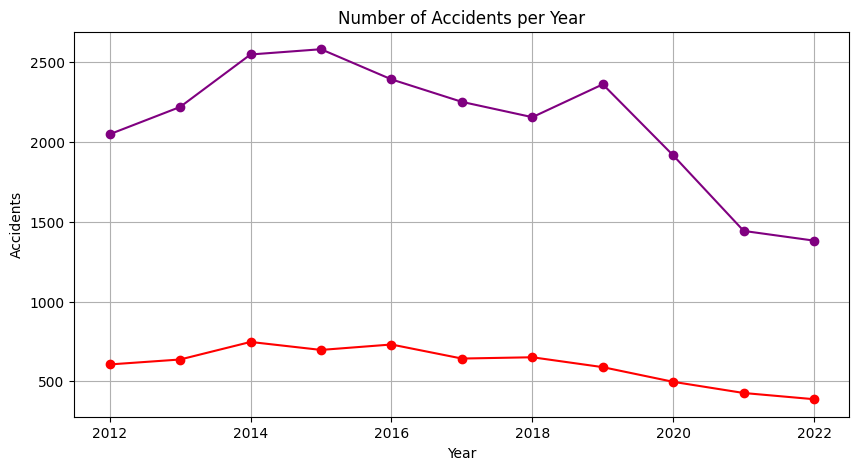

In [23]:
# 노인 보행자 사고 증가율
import matplotlib.pyplot as plt


plt.figure(figsize=(10, 5))
plt.plot(accidents_df['year'], accidents_df['accidents'], marker='o', linestyle='-', color='purple')
plt.plot(accidents_within_500_df['year'], accidents_within_500_df['accidents'], marker='o', linestyle='-', color='r')
plt.xlabel('Year')
plt.ylabel('Accidents')
plt.title('Number of Accidents per Year')
plt.grid(True)
plt.xticks(df['year'])
plt.show()